In [137]:
import aptwrapper
import xarray as xr
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt
import pandas as pd
import matplotlib.dates
import pickle
import datetime as dt
from skimage.segmentation import mark_boundaries
import scipy.stats
from matplotlib.patches import FancyArrowPatch


from utils import annot, annotv, test_mean_differences

# Spectrum localisation and processing

In [138]:
dataset_id = 'recovery_timeline_april_HA'

maps = pickle.load(open('./cache/maps_aligned_processed.pkl', 'rb'))
maps_raw = pickle.load(open('./cache/maps_raw.pkl', 'rb'))

spectra = pickle.load(open('./cache/spectra_veven_processed.pkl', 'rb'))
spectra_raw = pickle.load(open('./cache/spectra_veven_raw.pkl', 'rb'))

spectra = spectra.isel(si=spectra.dataset_id==dataset_id)
spectra_raw = spectra_raw.isel(si=spectra_raw.dataset_id==dataset_id)

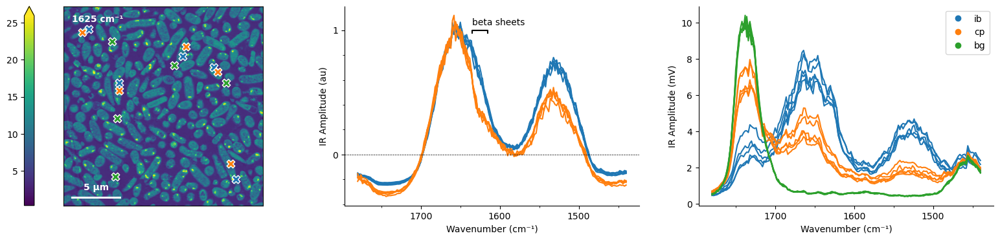

In [139]:
from matplotlib.lines import Line2D
from utils import get_ref_map

def plot_spectrum_example(ax=None, cax=None):
    if ax is None: fig, ax = plt.subplots(1, 3, figsize=(20, 4))

    ref_map = get_ref_map(spectra.isel(si=0), maps_raw)

    vmax = np.nanpercentile(ref_map, 100-.1)
    aptwrapper.plot_map(
        ref_map, ax=ax[0], cmap='viridis', flatten=False, annotation='1625 cm⁻¹', 
        cb_label='IR Amplitude (mV)', vmax=vmax,
        cbar_opts=dict(cax=cax, location='left')
    )

    for s in spectra['IR Amplitude (mV)'].sel(v=slice(1440, 1780)):
        feature = s.feature.item()
        if feature == 'bg': continue
        c = 'C0' if feature == 'ib' else 'C1' if feature == 'cp' else 'C2'
        ax[1].plot(s.v, s, c=c)

    for s in spectra_raw['IR Amplitude (mV)'].sel(v=slice(1440, 1780)):
        feature = s.feature.item()
        c = 'C0' if feature == 'ib' else 'C1' if feature == 'cp' else 'C2'
        ax[2].plot(s.v, s, c=c)
        aptwrapper.mark_location(s, ax=ax[0], c=c)
        ax[2].legend(handles=[
            Line2D([0], [0], color='C0', lw=0, marker='o', label='ib'),
            Line2D([0], [0], color='C1', lw=0, marker='o', label='cp'),
            Line2D([0], [0], color='C2', lw=0, marker='o', label='bg'),
        ])

    ax[1].invert_xaxis()
    ax[2].invert_xaxis()
    ax[1].set(xlabel='Wavenumber (cm⁻¹)', ylabel='IR Amplitude (au)')
    ax[2].set(xlabel='Wavenumber (cm⁻¹)', ylabel='IR Amplitude (mV)')
    sns.despine(ax=ax[1])
    sns.despine(ax=ax[2])
    for a in ax[1:]:
        a.xaxis.set_major_locator(plt.MultipleLocator(100))
        a.xaxis.set_minor_locator(plt.MultipleLocator(50))
    ax[1].yaxis.set_major_locator(plt.MultipleLocator(1))
    ax[1].yaxis.set_minor_locator(plt.MultipleLocator(.2))
    ax[1].axhline(0, c='k', lw=.5, ls='--')

    # annot(ax[1], 1625,20, 'beta sheets')
    ax[1].plot([1635, 1635, 1615, 1615], [.975, 1, 1, .975], c='k')
    ax[1].text(1635, 1.025, 'beta sheets', ha='left', va='bottom')

plot_spectrum_example()

# Spectrum quantification

(-18.300844204064006, 41.780779479755104)


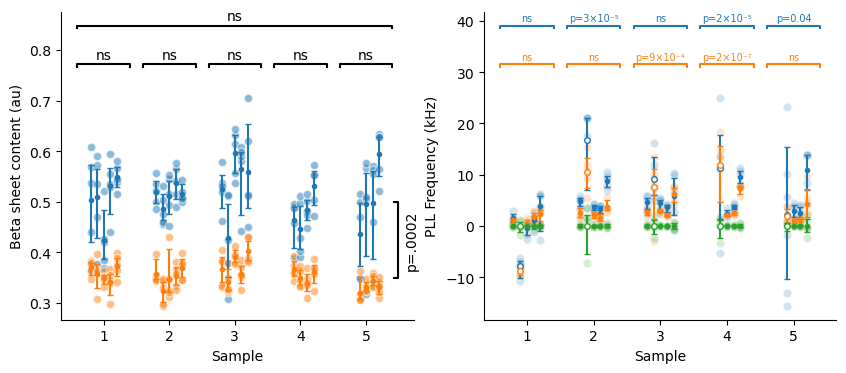

In [140]:
from scipy.stats import bootstrap
spectrum_stats = pickle.load(open('./cache/spectrum_quantification.pkl', 'rb')).query(
    "experiment == 'wt_repeats'"# and feature != 'bg'"
)

def split_plot(
        df, ax, x_major, x_minor, y, hue=None, 
        major_order=None, minor_order=None, hue_order=None, 
        alpha=.5, kind='scatter', error_marker='.', error_marker_size=None,
        error_marker_hollow=False
):
    all_xs = []

    x_major_values = major_order or df[x_major].unique()
    if hue in df and hue_order is None: 
        hue_order = list(df[hue].unique())

    for i in range(len(x_major_values)):
        df1 = df[df[x_major] == x_major_values[i]]

        x_minor_values = minor_order or df1[x_minor].unique()
        num_minor = len(x_minor_values)
    
        for j in range(num_minor):
            df2 = df1[df1[x_minor] == x_minor_values[j]]
            x = 1 + i + (j - num_minor/2 + .5) / num_minor * .5
            all_xs.append(x)

            if hue in df: 
                c = ['C' + str(hue_order.index(f)) for f in df2[hue]]
            else:
                c = np.repeat([hue or 'C0'], len(df2))

            for color, df3 in df2.groupby(c):

                if kind == 'scatter' or kind == 'both':
                    ax.scatter(
                        np.repeat(x, len(df3)), 
                        df3[y],
                        c=color, ec='w', alpha=alpha
                    )

                if (kind == 'error' or kind == 'both') and len(df3) > 0:
                    m = df3[y].mean()
                    ci = bootstrap((df3[y].dropna().to_numpy(),), np.mean, confidence_level=0.95).confidence_interval
                    # for xi, mi, ci_i, c_i in np.broadcast(x, m, ci, c):
                    #     ax.errorbar(xi, mi, ([mi-ci_i.low], [ci_i.high-mi]), c=color_i, capsize=2, marker='.')
                    
                    ax.errorbar(
                        x, m, ([m-ci.low], [ci.high-m]), 
                        c=color, capsize=2, marker=error_marker, ms=error_marker_size,
                        mfc='w' if error_marker_hollow else color,
                    )

    return all_xs

import matplotlib.scale

def plot_spectrum_stats(ax=None):
    if ax is None: fig, ax = plt.subplots(1, 2, figsize=(10, 4))

    split_plot(
        spectrum_stats.query('feature!="bg"'), ax[0], 
        x_major='sample_id', x_minor='repeat', 
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        y='beta', 
        hue='feature', #hue_order=['ib', 'cp', 'bg']
        kind='both'
    )

    # PLL except for repeat 2
    split_plot(
        spectrum_stats.assign(pllt=np.arctan(spectrum_stats.pll)).query('repeat!=2'), ax[1], 
        x_major='sample_id', x_minor='repeat', 
        y='pll', 
        hue='feature', #hue_order=['ib', 'cp', 'bg']
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        kind='both',
        alpha=.2,
    )

    # PLL repeat 2
    split_plot(
        spectrum_stats.assign(pllt=np.arctan(spectrum_stats.pll)).query('repeat==2'), ax[1], 
        x_major='sample_id', x_minor='repeat', 
        y='pll', 
        hue='feature', #hue_order=['ib', 'cp', 'bg']
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        kind='both',
        alpha=.2,
        error_marker='o', error_marker_size=4, error_marker_hollow=True
    )

    n = len(spectrum_stats.sample_id.unique())
    # ax[0].set_xticks(range(1,n+1), ['MA', 'MB', 'MC', 'O', 'J'])
    # ax[1].set_xticks(range(1,n+1), ['MA', 'MB', 'MC', 'O', 'J'])
    ax[0].set_xlabel('Sample')
    ax[1].set_xlabel('Sample')
    ax[0].set_ylabel('Beta sheet content (au)')
    ax[1].set_ylabel('PLL Frequency (kHz)')
    # ax[1].set_yscale('asinh')
    # ax[1].set_yticks
    sns.despine(ax=ax[0])
    sns.despine(ax=ax[1])

    annot(ax[0], [1,2,3,4,5], .4, 'ns')
    annot(ax[0], 3, 2.4, 'ns')
    annotv(ax[0], .425, .075, 'p=.0002')

    # annot(ax[1], [1,2,3,4,5], .4, ['ns', 'ns', 'p=9e-4', 'p=2e-7', 'ns'], c='C1', size='small')
    # annot(ax[1], [1,2,3,4,5], .4, ['ns', 'p=3e-5', 'ns', 'p=2e-5', 'p=.04'], c='C0', size='small')
    
    annot(ax[1], [1,2,3,4,5], .4, ['ns', 'ns', 'p=9×10⁻⁴', 'p=2×10⁻⁷', 'ns'], c='C1', size='x-small')
    annot(ax[1], [1,2,3,4,5], .4, ['ns', 'p=3×10⁻⁵', 'ns', 'p=2×10⁻⁵', 'p=0.04'], c='C0', size='x-small')


    # annot(ax[1], [1.5, 2.5], .425, ['p=.008', 'ns'])
    # annot(ax[1], 2, .95, 'p=.005')

    print(ax[1].get_ylim())

plot_spectrum_stats()

Beta: no technical variability

In [141]:
test_mean_differences(
    spectrum_stats.query('feature!="bg"'), 
    outcome='beta', 
    groupby=['sample_id', 'feature'], 
    subgroups='repeat'
)

reject_H0  using_anova    p_anova  p_kruskal  \
sample_id      feature                                                 
wt_repeats_J10 cp           False         True  13.494190  17.709915   
               ib           False         True   2.501577   7.025424   
wt_repeats_M1A cp           False         True   9.050768   6.032269   
               ib           False         True   6.444743   9.387279   
wt_repeats_M1B cp           False         True  13.822185   9.468166   
               ib           False         True  12.260530  17.655247   
wt_repeats_M1C cp           False         True   0.297155   0.796949   
               ib           False         True   1.070105   1.887111   
wt_repeats_O21 cp           False         True  13.155979   9.936113   
               ib           False         True   4.453290   3.013477   

                                                       p_shapiro  p_bartlett  \
sample_id      feature                                                         
wt_repeats_J10 cp               [60.327, 23.795, 59.644, 41.581]   63.692951   
               ib                [3.755, 17.786, 61.333, 24.175]   38.848872   
wt_repeats_M1A cp        [18.163, 24.524, 52.835, 27.56, 57.459]   22.865785   
               ib         [43.298, 34.53, 20.818, 36.08, 61.906]   11.754750   
wt_repeats_M1B cp          [1.262, 13.808, 3.371, 46.722, 23.34]   28.935889   
               ib       [63.563, 31.189, 43.823, 52.018, 19.663]   40.179734   
wt_repeats_M1C cp          [18.387, 12.9, 36.208, 62.469, 3.151]   46.635591   
               ib        [47.205, 31.444, 24.958, 0.548, 38.225]   26.812872   
wt_repeats_O21 cp                    [0.64, 8.38, 41.626, 61.41]   21.101822   
               ib                   [7.128, 5.871, 6.193, 7.131]   37.081520   

                            n_per_group  bonferroni_multiplier  
sample_id      feature                                          
wt_repeats_J10 cp          [5, 5, 5, 5]                     66  
               ib          [5, 5, 5, 5]                     66  
wt_repeats_M1A cp       [5, 5, 5, 5, 5]                     66  
               ib       [5, 5, 5, 5, 5]                     66  
wt_repeats_M1B cp       [5, 5, 5, 5, 5]                     66  
               ib       [5, 5, 5, 5, 5]                     66  
wt_repeats_M1C cp       [5, 5, 5, 5, 5]                     66  
               ib       [5, 5, 5, 5, 5]                     66  
wt_repeats_O21 cp          [5, 5, 5, 5]                     66  
               ib          [5, 5, 5, 5]                     66

Beta: no biological variability

In [142]:
test_mean_differences(
    spectrum_stats,#.query('feature!="bg"'), 
    outcome='beta', 
    groupby='feature',
    subgroups='sample_id',
    mean_over='repeat'
)

,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
feature,,,,,,,,
bg,False,True,13.199723,14.142593,"[17.307, 20.227, 0.161, 4.592, 7.928]",11.100814,"[4, 5, 5, 5, 4]",21
cp,False,True,0.763804,1.585830,"[17.277, 14.068, 13.757, 17.723, 17.079]",10.033400,"[4, 5, 5, 5, 4]",21
ib,False,True,12.852354,9.678884,"[14.695, 6.504, 14.799, 6.34, 11.773]",5.007174,"[4, 5, 5, 5, 4]",21


Beta: IBs have more beta than CPs

In [143]:
dfs = spectrum_stats.groupby(['sample_id', 'feature']).mean(numeric_only=True)
print(scipy.stats.shapiro(dfs.query('feature=="ib"').beta))
print(scipy.stats.shapiro(dfs.query('feature=="cp"').beta))
print(scipy.stats.bartlett(dfs.query('feature=="ib"').beta, dfs.query('feature=="cp"').beta))
t=scipy.stats.ttest_rel(dfs.query('feature=="ib"').beta, dfs.query('feature=="cp"').beta)
print(t)
print(t.confidence_interval())
print('alpha', .05/4)
print('p_adj', t.pvalue*4)

ShapiroResult(statistic=0.9734219378844485, pvalue=0.8967276987967574)
ShapiroResult(statistic=0.9732275265123316, pvalue=0.8955357432356588)
BartlettResult(statistic=0.29385091605896224, pvalue=0.5877632753537947)
TtestResult(statistic=18.549684461436087, pvalue=4.9709262757403476e-05, df=4)
ConfidenceInterval(low=0.13161776418541637, high=0.17795314132342333)
alpha 0.0125
p_adj 0.0001988370510296139


T-test of ib/cp beta ratio

In [144]:
df = dfs.beta.unstack().assign(ratio=lambda x: x.ib/x.cp)
print(scipy.stats.shapiro(df.ratio))
t = scipy.stats.ttest_1samp(df.ratio, 1)
print(t)
print(t.confidence_interval())
print(df.ratio.mean())

ShapiroResult(statistic=0.9973313232183703, pvalue=0.9979960903925873)
TtestResult(statistic=15.594064873599685, pvalue=9.87416809888663e-05, df=4)
ConfidenceInterval(low=1.3613443568079926, high=1.5178871141807189)
1.4396157354943557


PLL: lots of technical variability, if excluding repeat 2

In [145]:
test_mean_differences(
    spectrum_stats.query('feature!="bg" and repeat!=2'), 
    outcome='pll', 
    groupby=['sample_id', 'feature'], 
    subgroups='repeat'
)

reject_H0  using_anova       p_anova  p_kruskal  \
sample_id      feature                                                    
wt_repeats_J10 cp            True         True  1.544364e-07   0.338021   
               ib            True         True  2.364844e-05   0.137429   
wt_repeats_M1A cp           False         True  1.770450e+00   5.843066   
               ib           False         True  2.932862e+00   3.528354   
wt_repeats_M1B cp           False         True  1.093976e+00   1.374621   
               ib            True         True  2.565538e-05   0.175819   
wt_repeats_M1C cp            True         True  8.921094e-04   0.166656   
               ib           False         True  3.582476e+01  23.768721   
wt_repeats_O21 cp           False        False  3.342881e+00   9.731341   
               ib            True         True  3.767270e-02   0.680690   

                                               p_shapiro  p_bartlett  \
sample_id      feature                                                 
wt_repeats_J10 cp                 [45.37, 24.131, 1.495]    1.660381   
               ib                 [37.1, 50.935, 28.929]    6.015814   
wt_repeats_M1A cp       [34.795, 55.995, 38.162, 11.622]    2.867087   
               ib          [53.733, 13.88, 8.392, 1.012]    2.497531   
wt_repeats_M1B cp        [25.213, 51.012, 11.393, 6.104]   44.249786   
               ib         [20.243, 7.806, 1.608, 45.785]   26.525827   
wt_repeats_M1C cp         [15.626, 46.713, 14.348, 8.42]    0.210822   
               ib        [25.376, 10.905, 4.587, 29.878]    0.140582   
wt_repeats_O21 cp               [33.364, 13.225, 53.778]    0.019931   
               ib                [20.461, 24.603, 2.941]    3.145443   

                         n_per_group  bonferroni_multiplier  
sample_id      feature                                       
wt_repeats_J10 cp          [5, 5, 5]                     56  
               ib          [5, 5, 5]                     56  
wt_repeats_M1A cp       [5, 5, 5, 5]                     56  
               ib       [5, 5, 5, 5]                     56  
wt_repeats_M1B cp       [5, 5, 5, 5]                     56  
               ib       [5, 5, 5, 5]                     56  
wt_repeats_M1C cp       [5, 5, 5, 5]                     56  
               ib       [5, 5, 5, 5]                     56  
wt_repeats_O21 cp          [5, 5, 5]                     56  
               ib          [5, 5, 5]                     56

PLL: biological variability within IBs when excluding repeat 2

In [146]:
test_mean_differences(
    spectrum_stats
        .query('feature=="ib"')
        .query('repeat != 2')
    ,
    outcome='pll', 
    groupby='feature',
    subgroups='sample_id',
    mean_over='repeat'
)

,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
feature,,,,,,,,
ib,False,True,2.252654,1.718094,"[2.462, 5.286, 0.93, 6.019, 0.535]",1.274598,"[3, 4, 4, 4, 3]",7


In [147]:
import utils
utils.tukey_hsd(
    spectrum_stats
    .query('feature=="ib"')
    .query('repeat != 2 and sample_id.str.contains("M1")')
    ,
    outcome='pll', 
    groupby='sample_id', 
    mean_over=['repeat']
)

group1,group2,meandiff,p-adj,lower,upper,reject
wt_repeats_M1A,wt_repeats_M1B,3.6809,0.049,0.0171,7.3446,True
wt_repeats_M1A,wt_repeats_M1C,3.1162,0.0955,-0.5476,6.7799,False
wt_repeats_M1B,wt_repeats_M1C,-0.5647,0.904,-4.2285,3.099,False


PLL: only thing you can say is that IBs are stiffer than CPs

In [148]:
test_mean_differences(
    spectrum_stats.query('feature != "bg"'), 
    outcome='pll', 
    groupby='feature', 
    mean_over=['sample_id', 'repeat']
)

reject_H0                         False
using_anova                       False
p_anova                        0.892868
p_kruskal                      0.322862
p_shapiro                [0.008, 0.351]
p_bartlett                      1.46794
n_per_group                    [23, 23]
bonferroni_multiplier                 4
dtype: object

In [149]:
test_mean_differences(
    spectrum_stats
    .query('repeat != 2 and sample_id.str.contains("M1")')
    ,
    outcome='pll', 
    groupby='feature', 
    mean_over='sample_id'
)

reject_H0                                False
using_anova                              False
p_anova                               0.154257
p_kruskal                             0.254529
p_shapiro                [2.069, 4.902, 1.365]
p_bartlett                                 0.0
n_per_group                          [3, 3, 3]
bonferroni_multiplier                        5
dtype: object

# Map processing

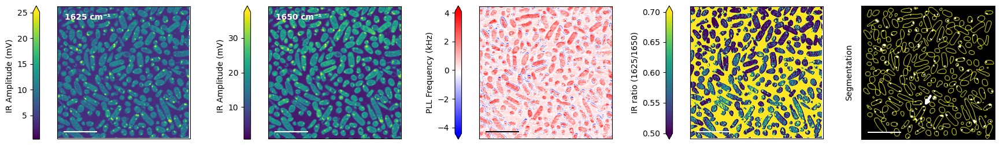

In [150]:
maps = pickle.load(open('./cache/maps_aligned_processed.pkl', 'rb'))

def plot(ax, hmap, cb_label, title='', vmin=None, vmax=None, cmap='viridis', **kwargs):
    vmin=vmin if vmin is not None else np.nanpercentile(hmap,     .1)
    vmax=vmax if vmax is not None else np.nanpercentile(hmap, 100-.1)
    
    aptwrapper.plot_map(
        hmap, ax=ax, **kwargs,
        flatten=False, cmap=cmap, cb_label=cb_label,
        vmin=vmin, vmax=vmax,
    )
    ax.set_title(title)

def plot_maps_example(ax=None):
    if ax is None: 
        fig, ax = plt.subplots(1, 5, figsize=(22, 3), gridspec_kw=dict(width_ratios=[1, 1, 1, 1, .8]))

    im = maps['recovery_timeline_april_HA']

    plot(ax[0], im.amp1625, 'IR Amplitude (mV)', vmin=0, annotation='1625 cm⁻¹', show_sb_val=False)
    plot(ax[1], im.amp1650, 'IR Amplitude (mV)', vmin=0, annotation='1650 cm⁻¹', show_sb_val=False)
    plot(ax[2], im.pll, 'PLL Frequency (kHz)', cmap='bwr', sb_color='k', show_sb_val=False)
    plot(ax[3], im.amp1625/im.amp1650, 'IR ratio (1625/1650)', vmin=.5, vmax=.7, show_sb_val=False)
    ax[4].imshow(mark_boundaries(
        im.ib_labels.astype(bool),
        im.cell_labels.astype(bool),
        mode='thick'
    ), extent=aptwrapper.get_im_extent(im.pll))
    ax[4].set(xticks=[], yticks=[])
    ax[4].set_ylabel('Segmentation', labelpad=10)
    aptwrapper.add_scalebar(ax[4], show_value=False)
    ax[4].add_patch(FancyArrowPatch(
        (-962.4 + 1.5*.75, -641.3+2.5*.75), (-962.4, -641.3), arrowstyle='->', mutation_scale=10, color='w', lw=3
    ))

    for a in ax[0].figure.get_axes():
        if a.get_ylabel() == 'IR ratio (1625/1650)':
            a.yaxis.set_major_locator(plt.MultipleLocator(.05))
            
plot_maps_example()

# Map quantification

## Beta ratio

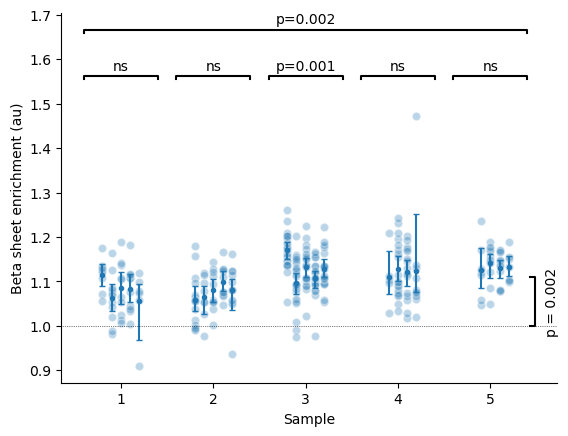

In [151]:
ibtable = pickle.load(open('./cache/ibtable.pkl', 'rb')).query("experiment == 'wt_repeats'")
celltable = pickle.load(open('./cache/celltable.pkl', 'rb')).query("experiment == 'wt_repeats'")

def plot_map_beta(ax=None):
    if ax is None: fig, ax = plt.subplots()
    split_plot(
        ibtable, ax, 
        x_major='sample_id', x_minor='repeat', 
        y='beta_ratio_fc', 
        alpha=.3,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        hue='C0'
    )
    ax.set_xlabel('Sample')
    ax.set_ylabel('Beta sheet enrichment (au)')
    sns.despine(ax=ax)
    ax.yaxis.set_major_locator(matplotlib.ticker.MultipleLocator(.1))
    ax.set_xticks(range(1,6), range(1,6))
    ax.axhline(1, c='k', ls=':', lw=.5)

    annot(ax, [1,2,3,4,5], .4, ['ns', 'ns', 'p=0.001', 'ns', 'ns'])
    annot(ax, 3, 2.4, 'p=0.002')
    annotv(ax, 1.055, .055, 'p = 0.002')
    
plot_map_beta()

Technical variability: only within sample MC

In [152]:
test_mean_differences(
    ibtable, 
    outcome='beta_ratio_fc', 
    groupby='sample_id', 
    subgroups='repeat'
)

,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
sample_id,,,,,,,,
wt_repeats_J10,False,False,32.278977,23.298734,"[16.98, 6.465, 12.705, 0.004]",1.020434,"[5, 19, 15, 10]",33
wt_repeats_M1A,False,True,8.909559,9.304290,"[23.188, 27.851, 19.388, 19.897, 0.945]",19.679238,"[8, 11, 10, 10, 6]",33
wt_repeats_M1B,False,True,12.550463,8.640312,"[5.576, 20.735, 20.553, 16.082, 5.127]",20.278983,"[15, 8, 10, 10, 11]",33
wt_repeats_M1C,True,True,0.001034,0.001729,"[19.276, 16.688, 30.153, 0.59, 19.132]",23.904320,"[21, 23, 19, 20, 18]",33
wt_repeats_O21,False,True,29.504536,23.360199,"[22.387, 5.225, 1.534, 7.903]",10.964547,"[7, 10, 11, 7]",33


Biological variability

In [153]:
test_mean_differences(
    ibtable, 
    outcome='beta_ratio_fc', 
    groupby='sample_id',
    mean_over='repeat'
)

reject_H0                                             True
using_anova                                           True
p_anova                                           0.002095
p_kruskal                                         0.026434
p_shapiro                [3.957, 3.946, 4.869, 4.87, 5.81]
p_bartlett                                        0.638657
n_per_group                                [4, 5, 5, 5, 4]
bonferroni_multiplier                                    7
dtype: object

In [154]:
utils.tukey_hsd(
    ibtable,
    outcome='beta_ratio_fc', 
    groupby='sample_id', 
    mean_over='repeat'
)

group1,group2,meandiff,p-adj,lower,upper,reject
wt_repeats_J10,wt_repeats_M1A,-0.04,0.0411,-0.0788,-0.0013,True
wt_repeats_J10,wt_repeats_M1B,-0.0437,0.0227,-0.0825,-0.005,True
wt_repeats_J10,wt_repeats_M1C,0.007,0.981,-0.0317,0.0458,False
wt_repeats_J10,wt_repeats_O21,0.0122,0.8916,-0.0286,0.0531,False
wt_repeats_M1A,wt_repeats_M1B,-0.0037,0.9978,-0.0403,0.0328,False
wt_repeats_M1A,wt_repeats_M1C,0.047,0.0083,0.0105,0.0836,True
wt_repeats_M1A,wt_repeats_O21,0.0522,0.0056,0.0135,0.091,True
wt_repeats_M1B,wt_repeats_M1C,0.0507,0.0043,0.0142,0.0873,True
wt_repeats_M1B,wt_repeats_O21,0.056,0.003,0.0172,0.0947,True
wt_repeats_M1C,wt_repeats_O21,0.0052,0.9937,-0.0335,0.044,False


95% CI of beta sheet enrichment: mean 1.11 (1.06-1.15)

In [155]:
df = ibtable.groupby('sample_id').mean(numeric_only=True)
t = scipy.stats.ttest_1samp(df.beta_ratio_fc, 1)
print('mean beta ratio fc:', df.beta_ratio_fc.mean())
print('alpha', .05/2)
print(scipy.stats.shapiro(df.beta_ratio_fc))
print(t)
print(t.confidence_interval(.975))
print('p_adj', t.pvalue*2)

mean beta ratio fc: 1.1074158609912668
alpha 0.025
ShapiroResult(statistic=0.8121500404703555, pvalue=0.10141115482300271)
TtestResult(statistic=8.745062391218624, pvalue=0.0009422330746412285, df=4)
ConfidenceInterval(low=1.064481686143948, high=1.1503500358385856)
p_adj 0.001884466149282457


## PLL

### PLL diff

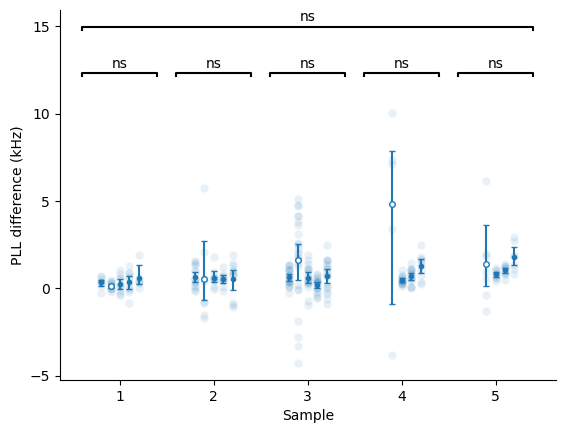

In [156]:
from scipy.stats import ttest_1samp
def plot_map_pll_diff(ax=None):
    if ax is None: fig, ax = plt.subplots()

    # Except repeat 2
    split_plot(
        ibtable.query('repeat!=2'), ax, 
        x_major='sample_id', x_minor='repeat', 
        y='ib_pll_diff', 
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        hue='C0',
        minor_order=[1,2,3,4,6],
    )
    # Repeat 2
    split_plot(
        ibtable.query('repeat==2'), ax, 
        x_major='sample_id', x_minor='repeat', 
        y='ib_pll_diff', 
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        error_marker='o', error_marker_size=4, error_marker_hollow=True,
        hue='C0',
    )
    ax.set_xlabel('Sample')
    ax.set_ylabel('PLL difference (kHz)')
    sns.despine(ax=ax)    
    ax.yaxis.set_major_locator(plt.MultipleLocator(5))
    # ax.set_xticks(range(1,6), ['MA', 'MB', 'MC', 'O', 'J'])

    annot(ax, [1,2,3,4,5], .4, 'ns')
    annot(ax, 3, 2.4, 'ns')

plot_map_pll_diff()

No technical variability in `ib_pll_diff` (even without repeat 2)

In [157]:
display(test_mean_differences(
    ibtable.query('repeat!=2'), 
    outcome='ib_pll_diff', 
    groupby='sample_id', 
    subgroups='repeat'
))

,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
sample_id,,,,,,,,
wt_repeats_J10,False,False,0.002849,0.112574,"[2.667, 18.889, 22.714]",0.005502,"[19, 15, 10]",28
wt_repeats_M1A,False,True,18.320447,23.115554,"[9.608, 18.707, 24.7, 0.906]",4.323674,"[9, 10, 10, 6]",28
wt_repeats_M1B,False,True,27.046839,20.864854,"[6.449, 1.888, 24.264, 1.092]",0.500890,"[15, 10, 10, 11]",28
wt_repeats_M1C,False,False,1.906361,1.105182,"[15.534, 16.289, 5.848, 25.615]",0.047520,"[21, 19, 20, 19]",28
wt_repeats_O21,False,False,0.010654,0.100548,"[27.243, 18.802, 15.147]",0.028287,"[10, 11, 7]",28


No biological variability in `ib_pll_diff`

In [158]:
test_mean_differences(
    ibtable.query('repeat!=2 and sample_id.str.contains("M1")'), 
    outcome='ib_pll_diff', 
    groupby='sample_id',
    mean_over='repeat'
)

reject_H0                                False
using_anova                               True
p_anova                               1.166503
p_kruskal                             1.159396
p_shapiro                [1.263, 4.382, 0.519]
p_bartlett                            0.707125
n_per_group                          [4, 4, 4]
bonferroni_multiplier                        5
dtype: object

IBs are stiffer than CPs

In [159]:
df = ibtable.groupby('sample_id').mean(numeric_only=True)
print('mean ib pll diff:', df.ib_pll_diff.mean())
print('alpha:', .05/2)
print(scipy.stats.shapiro(df.ib_pll_diff))
t = scipy.stats.ttest_1samp(df.ib_pll_diff, 0)
print(t)
print(t.confidence_interval())

mean ib pll diff: 0.8098977057901248
alpha: 0.025
ShapiroResult(statistic=0.9317159673648999, pvalue=0.6081182338257587)
TtestResult(statistic=4.8672478852142875, pvalue=0.008236041510304775, df=4)
ConfidenceInterval(low=0.3479042807618206, high=1.2718911308184289)


### PLL means

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


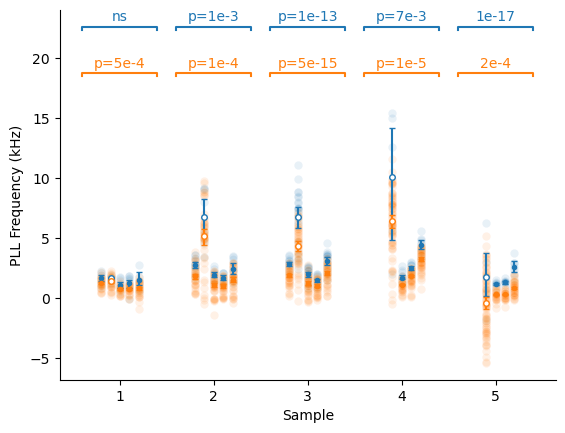

In [160]:
from scipy.stats import ttest_1samp
def plot_map_pll(ax=None):
    if ax is None: fig, ax = plt.subplots()
    split_plot(
        ibtable.query('repeat!=2'), ax, 
        x_major='sample_id', x_minor='repeat', 
        y='ib_pll_mean', 
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
    )
    split_plot(
        ibtable.query('repeat==2'), ax, 
        x_major='sample_id', x_minor='repeat', 
        y='ib_pll_mean', 
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        error_marker='o', error_marker_size=4, error_marker_hollow=True
    )
    split_plot(
        celltable.query('repeat!=2'), ax, 
        x_major='sample_id', x_minor='repeat', 
        y='cp_pll_mean', 
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        hue='C1'
    )
    split_plot(
        celltable.query('repeat==2'), ax, 
        x_major='sample_id', x_minor='repeat', 
        y='cp_pll_mean', 
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        hue='C1',
        error_marker='o', error_marker_size=4, error_marker_hollow=True
    )
    ax.set_xlabel('Sample')
    ax.set_ylabel('PLL Frequency (kHz)')
    sns.despine(ax=ax)    

    annot(ax, [1,2,3,4,5], .4, ['p=5e-4', 'p=1e-4', 'p=5e-15', 'p=1e-5', '2e-4'], c='C1')
    # annot(ax, 3, 2.4, 'ns', c='C1')
    annot(ax, [1,2,3,4,5], .4, ['ns', 'p=1e-3', 'p=1e-13', 'p=7e-3', '1e-17'], c='C0')
    # annot(ax, 3, 2.4, 'ns', c='C0')
    
    import os
    output_directory = "../figures"
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)
    fig.savefig('../figures/supp_pllmeans.eps', bbox_inches='tight')

plot_map_pll()

Some technical differences in `ib_pll_mean`, even without repeat 2

In [161]:
display(test_mean_differences(
    ibtable.query('repeat!=2'), 
    outcome='ib_pll_mean', 
    groupby='sample_id', 
    subgroups='repeat',
))

,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
sample_id,,,,,,,,
wt_repeats_J10,True,True,1.147716e-17,1.234775e-06,"[0.422, 21.917, 23.99]",1.052698,"[19, 15, 10]",28
wt_repeats_M1A,False,True,2.680921e+00,1.776436e+00,"[26.653, 20.222, 3.645, 16.849]",10.517920,"[9, 10, 10, 6]",28
wt_repeats_M1B,True,True,1.133317e-03,4.560433e-03,"[13.726, 12.567, 2.717, 9.375]",0.546705,"[15, 10, 10, 11]",28
wt_repeats_M1C,True,True,1.167056e-13,3.328140e-09,"[24.532, 2.309, 7.008, 8.211]",0.137385,"[21, 19, 20, 19]",28
wt_repeats_O21,True,False,2.095837e-06,7.366170e-03,"[27.718, 5.393, 27.4]",0.002541,"[10, 11, 7]",28


Some technical differences in `cp_pll_mean`, even without repeat 2

In [162]:
display(test_mean_differences(
    ibtable.query('repeat!=2'), 
    outcome='cp_pll_mean', 
    groupby='sample_id', 
    subgroups='repeat'
))

,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
sample_id,,,,,,,,
wt_repeats_J10,True,False,9.305424e-11,1.197836e-05,"[27.661, 24.453, 25.247]",0.041039,"[19, 15, 10]",28
wt_repeats_M1A,True,True,5.106179e-04,8.536962e-03,"[1.602, 2.596, 5.893, 7.257]",0.256725,"[9, 10, 10, 6]",28
wt_repeats_M1B,True,True,1.390822e-04,3.011610e-03,"[19.615, 5.914, 7.24, 0.599]",11.158868,"[15, 10, 10, 11]",28
wt_repeats_M1C,True,True,4.962219e-15,5.162774e-10,"[10.57, 0.213, 3.635, 6.879]",6.187534,"[21, 19, 20, 19]",28
wt_repeats_O21,True,True,2.158522e-04,9.965422e-02,"[4.149, 0.796, 2.107]",0.686720,"[10, 11, 7]",28


No biological differences

In [163]:
test_mean_differences(
    ibtable.query('repeat!=2 and sample_id.str.contains("M1")'), 
    outcome='ib_pll_mean', 
    groupby='sample_id',
    mean_over='repeat'
)

reject_H0                                False
using_anova                               True
p_anova                               0.343579
p_kruskal                             0.418394
p_shapiro                [3.979, 4.027, 3.245]
p_bartlett                            1.415735
n_per_group                          [4, 4, 4]
bonferroni_multiplier                        5
dtype: object

In [164]:
test_mean_differences(
    ibtable.query('repeat!=2 and sample_id.str.contains("M1")'), 
    outcome='cp_pll_mean', 
    groupby='sample_id',
    mean_over='repeat'
)

reject_H0                                False
using_anova                               True
p_anova                               0.355646
p_kruskal                             0.345197
p_shapiro                [0.082, 2.876, 1.282]
p_bartlett                            2.067558
n_per_group                          [4, 4, 4]
bonferroni_multiplier                        5
dtype: object

## PLL z

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


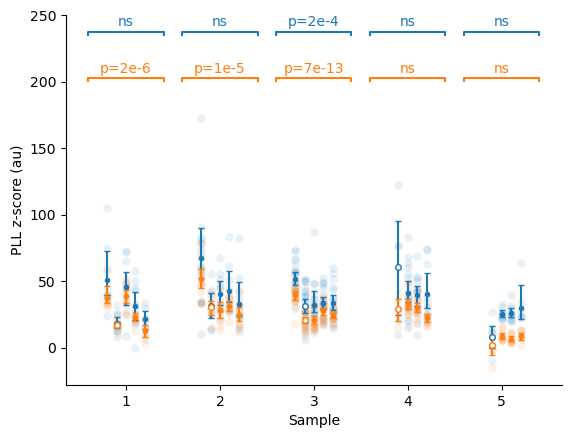

In [165]:
def plot_pll_z(ax=None):
    if ax is None: fig, ax = plt.subplots()
    
    split_plot(
        ibtable.query('repeat!=2'),
        plt.gca(),
        x_major='sample_id', x_minor='repeat',
        # y='ib_pll_diff',
        y='ib_pll_z_mean',
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
    )
    split_plot(
        ibtable.query('repeat==2'),
        plt.gca(),
        x_major='sample_id', x_minor='repeat',
        # y='ib_pll_diff',
        y='ib_pll_z_mean',
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        error_marker='o', error_marker_size=4, error_marker_hollow=True
    )

    split_plot(
        ibtable.query('repeat!=2'),
        plt.gca(),
        x_major='sample_id', x_minor='repeat',
        # y='ib_pll_diff',
        y='cp_pll_z_mean',
        hue='C1',
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
    )
    split_plot(
        ibtable.query('repeat==2'),
        plt.gca(),
        x_major='sample_id', x_minor='repeat',
        # y='ib_pll_diff',
        y='cp_pll_z_mean',
        hue='C1',
        alpha=.1,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        error_marker='o', error_marker_size=4, error_marker_hollow=True
    )

    ax.set_ylabel('PLL z-score (au)')
    ax.set_xlabel('Sample')
    sns.despine(ax=ax)

    annot(ax, [1,2,3,4,5], .4, ['p=2e-6', 'p=1e-5', 'p=7e-13', 'ns', 'ns'], c='C1')
    annot(ax, [1,2,3,4,5], .4, ['ns', 'ns', 'p=2e-4', 'ns', 'ns'], c='C0')

    import os
    output_directory = "../figures"
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)
    fig.savefig('../figures/supp_pllzscore.eps', bbox_inches='tight')
    
plot_pll_z()

Technical variability in ibmean

In [166]:
display(test_mean_differences(
    ibtable.query('repeat!=2'), 
    outcome='ib_pll_z_mean', 
    groupby='sample_id', 
    subgroups='repeat',
))

,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
sample_id,,,,,,,,
wt_repeats_J10,False,True,26.386105,25.322655,"[7.841, 25.832, 0.598]",13.902873,"[19, 15, 10]",28
wt_repeats_M1A,False,True,0.762809,0.483391,"[1.893, 20.831, 25.73, 26.122]",5.793457,"[9, 10, 10, 6]",28
wt_repeats_M1B,False,True,0.253812,0.232205,"[0.791, 16.001, 0.893, 0.433]",0.370211,"[15, 10, 10, 11]",28
wt_repeats_M1C,True,True,0.000207,0.000342,"[20.194, 0.068, 9.074, 7.02]",7.365098,"[21, 19, 20, 19]",28
wt_repeats_O21,False,False,17.156621,26.760815,"[5.473, 3.088, 1.284]",0.007631,"[10, 11, 7]",28


Technical variability in cpmean

In [167]:
display(test_mean_differences(
    ibtable.query('repeat!=2'), 
    outcome='cp_pll_z_mean', 
    groupby='sample_id', 
    subgroups='repeat',
))

,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
sample_id,,,,,,,,
wt_repeats_J10,False,True,6.650687e-02,3.807006e-02,"[1.135, 27.534, 17.14]",2.690158,"[19, 15, 10]",28
wt_repeats_M1A,True,True,2.015208e-06,4.733334e-04,"[0.126, 8.016, 14.537, 25.072]",13.084559,"[9, 10, 10, 6]",28
wt_repeats_M1B,True,True,1.107067e-05,3.910968e-04,"[3.419, 20.082, 15.349, 17.29]",2.687364,"[15, 10, 10, 11]",28
wt_repeats_M1C,True,True,6.853563e-13,1.220637e-07,"[0.679, 0.581, 3.734, 13.504]",5.858792,"[21, 19, 20, 19]",28
wt_repeats_O21,False,True,9.134386e+00,5.943053e+00,"[0.279, 0.354, 13.176]",23.365708,"[10, 11, 7]",28


no biological variability in ibmean

In [168]:
test_mean_differences(
    ibtable.query('repeat!=2 and sample_id.str.contains("M1")'), 
    outcome='ib_pll_z_mean', 
    groupby='sample_id',
    mean_over='dataset_id'
)

reject_H0                                False
using_anova                              False
p_anova                               2.959859
p_kruskal                             3.338734
p_shapiro                [3.666, 1.323, 0.045]
p_bartlett                             3.81283
n_per_group                          [4, 4, 4]
bonferroni_multiplier                        5
dtype: object

no biological variability in cpmean

In [169]:
test_mean_differences(
    ibtable.query('repeat!=2 and sample_id.str.contains("M1")'), 
    outcome='ib_pll_z_mean', 
    groupby='sample_id',
    mean_over='dataset_id'
)

reject_H0                                False
using_anova                              False
p_anova                               2.959859
p_kruskal                             3.338734
p_shapiro                [3.666, 1.323, 0.045]
p_bartlett                             3.81283
n_per_group                          [4, 4, 4]
bonferroni_multiplier                        5
dtype: object

## Number

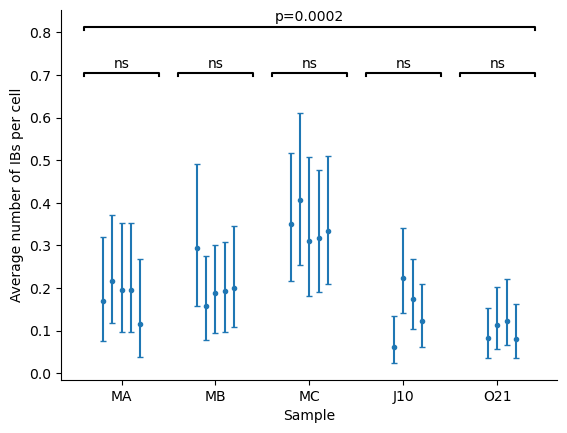

In [170]:
def plot_ib_number(ax=None):
    if ax is None: fig, ax = plt.subplots()
    
    split_plot(
        celltable, ax, 
        x_major='sample_id', x_minor='repeat', 
        y='cell_num_ibs',
        kind='error',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        hue='C0',
        minor_order=[1,2,3,4,6],
    )
    
    ax.set_xlabel('Sample')
    ax.set_ylabel('Average number of IBs per cell')
    sns.despine(ax=ax)
    ax.set_xticks(range(1,6), ['MA', 'MB', 'MC', 'J10', 'O21'])

    annot(ax, [1,2,3,4,5], .4,'ns')

    # annot(ax, [1.95, 4.05], .95, ['p=.006', 'p=.0002'])
    # annot(ax, [2.45, 3.55], .45, ['p=.012', 'p=.002'])
    # annot(ax, [2, 4], .95, ['p=.0002', 'p=3e-6'])
    # annot(ax, 3.5, 1.45, 'p=.02')
    # annot(ax, [2.5, 3.5], .45, ['p=.001', 'p=5e-5'])
    annot(ax, 3, 2.4, 'p=0.0002')

plot_ib_number()

No technical variability

In [171]:
test_mean_differences(
    celltable, 
    outcome='cell_num_ibs', 
    groupby='sample_id', 
    subgroups='repeat'
)

,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
sample_id,,,,,,,,
wt_repeats_J10,False,False,1.021824,1.555809,"[0.0, 0.0, 0.0, 0.0]",0.000002,"[82, 85, 86, 81]",33
wt_repeats_M1A,False,False,26.275213,22.955802,"[0.0, 0.0, 0.0, 0.0, 0.0]",22.212880,"[53, 51, 51, 51, 52]",33
wt_repeats_M1B,False,False,19.598760,28.101517,"[0.0, 0.0, 0.0, 0.0, 0.0]",0.280343,"[51, 51, 53, 52, 55]",33
wt_repeats_M1C,False,False,30.288213,29.672992,"[0.0, 0.0, 0.0, 0.0, 0.0]",18.326939,"[60, 59, 61, 63, 57]",33
wt_repeats_O21,False,False,25.506367,28.820600,"[0.0, 0.0, 0.0, 0.0]",0.333772,"[85, 89, 90, 86]",33


Some biological variability

In [172]:
test_mean_differences(
    celltable, 
    outcome='cell_num_ibs', 
    groupby='sample_id', 
    mean_over='repeat'
)

reject_H0                                               True
using_anova                                             True
p_anova                                             0.000024
p_kruskal                                           0.023534
p_shapiro                [6.791, 2.149, 0.891, 1.755, 1.328]
p_bartlett                                          2.962089
n_per_group                                  [4, 5, 5, 5, 4]
bonferroni_multiplier                                      7
dtype: object

In [173]:
import utils
utils.tukey_hsd(
    celltable,
    outcome='cell_num_ibs',
    groupby='sample_id',
    mean_over='repeat',
    print_pvals=True
)

[8.21900385e-01 3.23364884e-01 4.49577249e-05 6.30906946e-01
 8.73303271e-01 2.00551537e-04 1.23468093e-01 1.47518467e-03
 2.12739118e-02 2.76512579e-06]


group1,group2,meandiff,p-adj,lower,upper,reject
wt_repeats_J10,wt_repeats_M1A,0.033,0.8219,-0.0608,0.1268,False
wt_repeats_J10,wt_repeats_M1B,0.0608,0.3234,-0.033,0.1546,False
wt_repeats_J10,wt_repeats_M1C,0.1982,0.0,0.1044,0.292,True
wt_repeats_J10,wt_repeats_O21,-0.046,0.6309,-0.1449,0.0528,False
wt_repeats_M1A,wt_repeats_M1B,0.0278,0.8733,-0.0606,0.1162,False
wt_repeats_M1A,wt_repeats_M1C,0.1652,0.0002,0.0768,0.2536,True
wt_repeats_M1A,wt_repeats_O21,-0.079,0.1235,-0.1728,0.0148,False
wt_repeats_M1B,wt_repeats_M1C,0.1374,0.0015,0.049,0.2258,True
wt_repeats_M1B,wt_repeats_O21,-0.1068,0.0213,-0.2006,-0.013,True
wt_repeats_M1C,wt_repeats_O21,-0.2442,0.0,-0.338,-0.1504,True


## Size

In [174]:
13 * (20/512)**2

0.01983642578125

In [175]:
10/512, 20/512

(0.01953125, 0.0390625)

In [176]:
ibtable[['ib_area', 'ib_area_px']].describe().assign(radius=lambda x: np.sqrt(x.ib_area/np.pi)*1e3)

,ib_area,ib_area_px,radius
count,287.000000,287.000000,9557.977680
mean,0.026661,69.898955,92.121658
std,0.022929,60.108936,85.430620
min,0.004959,13.000000,39.730751
25%,0.010300,27.000000,57.258107
50%,0.019836,52.000000,79.461503
75%,0.035286,92.500000,105.980501
max,0.128555,337.000000,202.287969


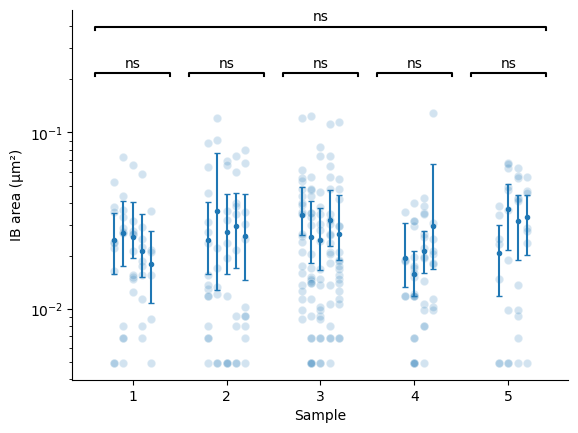

In [177]:
def plot_ib_size(ax=None):
    if ax is None: fig, ax = plt.subplots()
    split_plot(
        ibtable, ax, 
        x_major='sample_id', x_minor='repeat', 
        y='ib_area', 
        alpha=.2,
        kind='both',
        major_order=['wt_repeats_M1A', 'wt_repeats_M1B', 'wt_repeats_M1C', 'wt_repeats_J10', 'wt_repeats_O21'],
        minor_order=[1,2,3,4,6],
        hue='C0',
    )
    ax.set_yscale('log')
    ax.set_ylabel('IB area (µm²)')
    ax.set_xlabel('Sample')
    sns.despine(ax=ax)
    # ax.set_xticks(range(1,6), ['MA', 'MB', 'MC', 'O', 'J'])

    annot(ax, [1,2,3,4,5], .4, 'ns')
    annot(ax, 3, 2.4, 'ns')

plot_ib_size()

No technical variability

In [178]:
print(8.998/28)
test_mean_differences(
    ibtable, 
    outcome='ib_area', 
    groupby='sample_id', 
    subgroups='repeat'
)

0.32135714285714284


,reject_H0,using_anova,p_anova,p_kruskal,p_shapiro,p_bartlett,n_per_group,bonferroni_multiplier
sample_id,,,,,,,,
wt_repeats_J10,False,False,10.894515,12.781081,"[3.61, 0.587, 11.026, 0.0]",0.000457,"[5, 19, 15, 10]",33
wt_repeats_M1A,False,True,26.801687,26.812139,"[21.423, 3.738, 0.113, 0.737, 25.562]",21.488242,"[9, 11, 10, 10, 6]",33
wt_repeats_M1B,False,True,30.415618,32.908803,"[0.067, 0.113, 1.969, 6.384, 0.192]",7.869269,"[15, 8, 10, 10, 11]",33
wt_repeats_M1C,False,False,22.530595,9.679690,"[0.036, 0.001, 0.037, 0.121, 0.001]",31.610347,"[21, 24, 19, 20, 19]",33
wt_repeats_O21,False,True,15.888383,14.830055,"[16.099, 4.265, 1.54, 24.706]",12.594146,"[7, 10, 11, 7]",33


No biological variability

In [179]:
test_mean_differences(
    ibtable, 
    outcome='ib_area', 
    groupby='sample_id', 
    mean_over='repeat'
)

reject_H0                                             False
using_anova                                            True
p_anova                                            0.476465
p_kruskal                                          0.828497
p_shapiro                [4.712, 3.774, 2.151, 2.21, 3.001]
p_bartlett                                         5.484025
n_per_group                                 [4, 5, 5, 5, 4]
bonferroni_multiplier                                     7
dtype: object

## Location

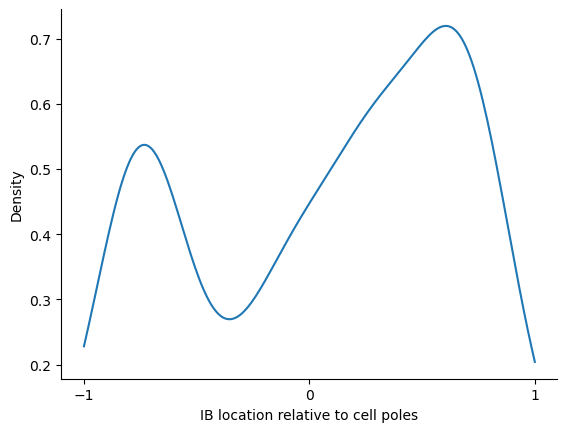

In [180]:
def plot_ib_location(ax=None):
    if ax is None: fig, ax = plt.subplots()
    sns.kdeplot(
        ibtable.query('cell_eccentricity>.9').ib_polar_projection, 
        ax=ax, clip=[-1,1], bw_adjust=.8,
        c='C0',
    )
    sns.despine(ax=ax)
    ax.set_xlabel('IB location relative to cell poles')
    ax.xaxis.set_major_locator(plt.MultipleLocator(1))

plot_ib_location()

# Composite

(-18.300844204064006, 41.780779479755104)


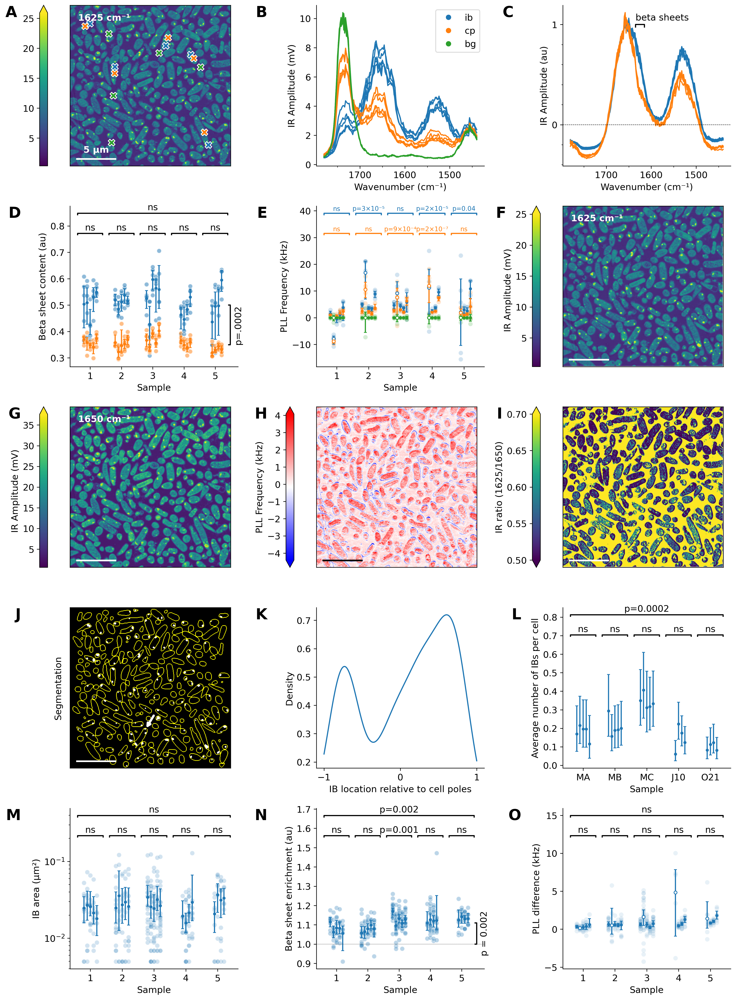

In [181]:
with plt.rc_context({
    'figure.figsize': (17,23),
    'figure.dpi': 300,
    'font.size': 12,
    'savefig.bbox': 'tight',
    'legend.loc': 'upper right',
}):

    fig, ax = plt.subplot_mosaic(
        gridspec_kw={'wspace': .1, 'hspace':.25},
        mosaic=[
            ['a', 'b', 'c'],
            ['d', 'e', 'f'],
            ['g', 'h', 'i'],
            ['j', 'k', 'l'],
            ['m', 'n', 'o'],
    ])

    plot_spectrum_example(ax=[ax['a'], ax['c'], ax['b']])
    plot_spectrum_stats([ax['d'], ax['e']])
    plot_maps_example(ax=[ax['f'], ax['g'], ax['h'], ax['i'], ax['j']])
    plot_ib_location(ax=ax['k'])
    plot_ib_number(ax=ax['l'])
    plot_ib_size(ax=ax['m'])
    plot_map_beta(ax=ax['n'])
    plot_map_pll_diff(ax=ax['o'])

    def pretend_colorbar(a, loc='right'):
        cb = plt.colorbar(ax['a'].images[0], ax=a, location=loc)
        cb.ax.set_visible(False)

    kwargs = dict(ha='right', va='top', xycoords=('axes points', 'axes fraction'), fontsize=20, fontweight='bold')
    # xy = (-55, 1)
    # for a in 'adgjm':
    #     ax[a].annotate(a.capitalize(), (-75, 1.04), **kwargs)
    # for a in 'bcefhiklno':
    #     ax[a].annotate(a.capitalize(), (-40,.99), **kwargs)

    ax['a'].annotate('A', (-70, 1), **kwargs)
    ax['b'].annotate('B', (-65, 1), **kwargs)
    ax['c'].annotate('C', (-65, 1), **kwargs)
    ax['d'].annotate('D', (-65, 1), **kwargs)
    ax['e'].annotate('E', (-65, 1), **kwargs)
    ax['f'].annotate('F', (-75, 1), **kwargs)
    ax['g'].annotate('G', (-65, 1), **kwargs)
    ax['h'].annotate('H', (-65, 1), **kwargs)
    ax['i'].annotate('I', (-80, 1), **kwargs)
    ax['j'].annotate('J', (-65, 1), **kwargs)
    ax['k'].annotate('K', (-65, 1), **kwargs)
    ax['l'].annotate('L', (-55, 1), **kwargs)
    ax['m'].annotate('M', (-65, 1), **kwargs)
    ax['n'].annotate('N', (-65, 1), **kwargs)
    ax['o'].annotate('O', (-55, 1), **kwargs)

    for a in 'bcdejklmno':
        pretend_colorbar(ax[a], loc='left')
    
    import os
    output_directory = "../figures"
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)    
        
    # fig.suptitle('Figure 2', y=.9, x=.1, ha='left', fontsize=24, weight='bold')

    plt.savefig('../figures/figure_2.jpg', bbox_inches='tight', dpi=600)
    plt.savefig('../figures/figure_2.pdf', bbox_inches='tight')
    fig.suptitle('')